# Data Preparation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')
import missingno as mno
import re
import pickle

In [2]:
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns", 100)

In [3]:
df = pd.read_csv('listings_dec18.csv')

Data yang akan di analisa ialah meruapakan dataset penggunaan jasa airbnb di kota Melbourne. Diketahui bahwa harga per malam setiap asset tersebut erat kaitannya dengan.

- Bedrooms ( Jenis kasur pada asset airbnb yang akan di tempati )
- Bathrooms ( Jumlah kamar mandi pada asset airbnb )
- Longitude / Latitude = Lokasi asset airbnb, semakin dekat ke pusat kota maka harganya semakin meningkat
- Minimum_nights = waktu minimum yang ditentukan oleh host untuk menginap di asset airbnb miliknya

Berikut merupakan gambaran awal dari dataset Melbourne airbnb.

In [4]:
df.shape

(22895, 96)

Dataset ini memiliki 22895 rows dan 96 fitur dengan penjelasan setiap fitur sebagai berikut,
(untuk mempermudah penjelasan fitur, fitur yang sifatnya sama dikelompokkan )

- id, listing_url, scrape_id, last_scraped, picture_url, calendar_last_scraped: Informasi kapan asset airbnb di scrapping dari web

- name: Nama asset airbnb

- summary, space , description, experiences_offered, neighborhood_overview, interaction: Penjelasan beserta deskripsi asset airbnb, baik dari sisi host maupun tetangga host

- transit, access : Akses untuk menuju asset airbnb

- host_id, host_url, host_name, host_since, host_location, host_about, host_response_time, host_response_rate,host_is_superhost, host_thumbnail_url, host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count, host_verifications, host_has_profile_pic, host_identity_verified : Informasi mengenai host dari asset airbnb, mulai dari identitas host hingga nilai host

- street, neighbourhood, neighbourhood_cleansed, city, state, zipcode, market, smart_location, country_code, 
  country, latitude, longitude, is_location_exact : Fitur yang menyangkut lokasi asset airbnb
  
- property_type, room_type, accommodates, bathrooms, bedrooms, beds, bed_type, amenities : Fasilitas yang ditawarkan  di asset airbnb

- price, security_deposit, cleaning_fee : Biaya yang harus dibayar, mulai dari biaya per malam hingga deposit saat kedatangan

- guests_included, extra_people, minimum_nights, maximum_nights : Waktu menginap guest  

- calendar_updated, has_availability, availability_30, availability_60, availability_90, availability_365 : Ketersediaan asset airbnb dalam beberapa jangka waktu (1-12 bulan)

- number_of_reviews, first_review, last_review, review_scores_rating, review_scores_accuracy,review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value, reviews_per_month : Penentuan nilai asset airbnb dari segi review guest yang sudah menginap

- requires_license, instant_bookable, is_business_travel_ready, cancellation_policy,require_guest_profile_picture, house_rules, require_guest_phone_verification,calculated_host_listings_count : Tata tertib host beserta langkah-langkah untuk booking asset airbnb

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22895 entries, 0 to 22894
Data columns (total 96 columns):
id                                  22895 non-null int64
listing_url                         22895 non-null object
scrape_id                           22895 non-null int64
last_scraped                        22895 non-null object
name                                22892 non-null object
summary                             22199 non-null object
space                               16844 non-null object
description                         22563 non-null object
experiences_offered                 22895 non-null object
neighborhood_overview               14424 non-null object
notes                               11546 non-null object
transit                             14943 non-null object
access                              15168 non-null object
interaction                         14537 non-null object
house_rules                         15032 non-null object
thumbnail_url          

In [6]:
df.head(10)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,9835,https://www.airbnb.com/rooms/9835,20181207034809,2018-12-07,Beautiful Room & House,NaN,"House: Clean, New, Modern, Quite, Safe. 10Km f...","House: Clean, New, Modern, Quite, Safe. 10Km f...",none,Very safe! Family oriented. Older age group.,NaN,"YES ! The bus (305,309) is exactly two blocks ...","Kitchen, backyard, upstairs lounge. We'd like ...",As much as the guest wants.,Prefence would be given females or a couple,NaN,NaN,https://a0.muscache.com/im/pictures/44620/5a58...,NaN,33057,https://www.airbnb.com/users/show/33057,Manju,2009-08-21,AU,About us: We are an East Indian couple in our ...,a few days or more,0%,NaN,f,https://a0.muscache.com/defaults/user_pic-50x5...,https://a0.muscache.com/defaults/user_pic-225x...,NaN,1.0,1.0,"['email', 'phone', 'reviews']",f,f,"Bulleen, VIC, Australia",Balwyn North,Manningham,NaN,Bulleen,VIC,3105,Melbourne,"Bulleen, Australia",AU,Australia,-37.772684,145.092133,f,House,Private room,2,1.0,1.0,2.0,Real Bed,"{Internet,Wifi,""Pets live on this property"",Do...",NaN,$60.00,NaN,NaN,NaN,NaN,1,$22.00,1,365,17 months ago,t,30,60,90,365,2018-12-07,4,2011-05-24,2015-09-12,90.0,9.0,10.0,10.0,10.0,9.0,9.0,f,NaN,NaN,f,f,strict_14_with_grace_period,f,f,1,0.04
1,10803,https://www.airbnb.com/rooms/10803,20181207034809,2018-12-07,Room in Cool Deco Apartment in Brunswick,A large air conditioned room with queen spring...,The apartment is Deco/Edwardian in style and h...,A large air conditioned room with queen spring...,none,This hip area is a crossroads between two grea...,NaN,Easy transport options - the tram is right out...,Wifi. Bathroom and kitchen is shared but I mos...,I'm home mostly but sometimes I may be working...,Theres a yoga studio downstairs so if you see ...,NaN,NaN,https://a0.muscache.com/im/pictures/31323790/9...,NaN,38901,https://www.airbnb.com/users/show/38901,Lindsay,2009-09-16,"Melbourne, Victoria, Australia",As an artist working in animation and video I ...,NaN,NaN,NaN,f,https://a0.muscache.com/im/users/38901/profile...,https://a0.muscache.com/im/users/38901/profile...,Brunswick,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"Brunswick East, VIC, Australia",Brunswick,Moreland,NaN,Brunswick East,VIC,3057,Melbourne,"Brunswick East, Australia",AU,Australia,-37.766505,144.980736,t,Apartment,Private room,2,1.0,1.0,1.0,Futon,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,H...",226.0,$35.00,$200.00,$803.00,$0.00,$9.00,1,$15.00,3,45,6 weeks ago,t,4,9,33,213,2018-12-07,108,2013-01-12,2018-11-26,87.0,9.0,8.0,9.0,9.0,9.0,9.0,f,NaN,NaN,t,f,moderate,t,t,1,1.50

In [7]:
df['last_scraped'].unique()

array(['2018-12-07', '2018-12-08'], dtype=object)

In [8]:
df.corr()

,id,scrape_id,thumbnail_url,medium_url,xl_picture_url,host_id,host_acceptance_rate,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,square_feet,guests_included,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,jurisdiction_names,calculated_host_listings_count,reviews_per_month
id,1.000000e+00,-2.341472e-13,NaN,NaN,NaN,5.454400e-01,NaN,8.150285e-02,8.150285e-02,NaN,1.015546e-02,-4.609102e-02,4.207179e-02,1.407539e-02,1.353587e-02,2.253420e-02,-0.038563,1.997503e-02,-1.248185e-02,-1.031615e-02,1.386018e-01,1.425555e-01,1.345143e-01,-6.469410e-02,-3.739593e-01,-3.955087e-02,-4.776432e-02,-3.293307e-02,-1.036795e-01,-7.970648e-02,-9.013067e-03,-1.878064e-02,NaN,6.570872e-02,1.990241e-01
scrape_id,-2.341472e-13,1.000000e+00,NaN,NaN,NaN,-2.749176e-14,NaN,-1.568072e-14,-1.568072e-14,NaN,-9.342679e-13,-1.638170e-12,1.392308e-14,5.142144e-15,2.195731e-15,-3.897031e-15,NaN,1.267486e-14,-2.600393e-15,1.152482e-15,4.532381e-14,-5.279869e-14,6.886036e-15,1.142069e-14,-1.032298e-13,5.769220e-15,-1.113834e-14,1.769951e-15,1.067988e-14,9.777105e-15,-1.095977e-15,7.263671e-15,NaN,4.044282e-15,-4.977025e-15
thumbnail_url,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medium_url,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
xl_picture_url,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
host_id,5.454400e-01,-2.749176e-14,NaN,NaN,NaN,1.000000e+00,NaN,-7.506735e-02,-7.506735e-02,NaN,-1.028083e-02,8.564273e-03,2.296363e-02,1.328507e-02,1.004406e-02,2.583298e-02,0.031172,2.947732e-02,-1.748339e-02,-7.181908e-03,1.505157e-01,1.543531e-01,1.532285e-01,-2.084289e-03,-2.083106e-01,-9.806383e-02,-9.066322e-02,-6.788276e-02,-1.233263e-01,-1.128852e-01,-5.176382e-02,-6.165272e-02,NaN,-8.166505e-02,1.335178e-01
host_acceptance_rate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
host_listings_count,8.150285e-02,-1.568072e-14,NaN,NaN,NaN,-7.506735e-02,NaN,1.000000e+00,1.000000e+00,NaN,2.378664e-02,-6.897541e-02,1.275934e-01,7.743427e-02,5.438981e-02,8.073030e-02,-0.028579,1.743913e-01,-6.222003e-03,-2.134923e-03,1.292943e-01,1.434631e-01,1.467369e-01,1.287845e-01,5.447354e-02,-9.149921e-02,-8.081747e-02,-4.955025e-02,-1.473801e-01,-9.508499e-02,9.574150e-03,-1.207018e-01,NaN,8.673102e-01,9.982033e-02
host_total_listings_count,8.150285e-02,-1.568072e-14,NaN,NaN,NaN,-7.506735e-02,NaN,1.000000e+00,1.000000e+00,NaN,2.378664e-02,-6.897541e-02,1.275934e-01,7.743427e-02,5.438981e-02,8.073030e-02,-0.028579,1.743913e-01,-6.222003e-03,-2.134923e-03,1.292943e-01,1.434631e-01,1.467369e-01,1.287845e-01,5.447354e-02,-9.149921e-02,-8.081747e-02,-4.955025e-02,-1.473801e-01,-9.508499e-02,9.574150e-03,-1.207018e-01,NaN,8.673102e-01,9.982033e-02
neighbourhood_group_cleansed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Memeriksa apakah ada file berekstensi 'txt' pada fitur, bila ada maka langsung di drop

In [9]:
column_to_drop = []
for element in df.columns:
    if 'txt' in element:
        column_to_drop.append(element[:-4])
df.drop(column_to_drop, axis=1, inplace=True)

In [10]:
len(df.columns)

96

Pembersihan fitur city, karena hasil scrapping masih kotor, maka dilakukan looping untuk replace char dan nama city
agar sesuai dengan suburb yang ada di kota melbourne

In [11]:
def hapus_koma(x):
    return x.replace(',','')

In [12]:
def hapus_titik(x):
    return x.replace('.','')

In [13]:
def ganti_suburb(x):
    if 'carlton' in x:  
        return 'Carlton'
    elif 'carlton north' in x:
        return 'Carlton North'
    elif 'docklands' in x:
        return 'Docklands'
    elif 'east melbourne' in x:
        return 'East Melbourne'
    elif 'flemington' in x:
        return 'Flemington'
    elif 'kensington' in x:
        return 'Kensington'
    elif 'north melbourne' in x:
        return 'North Melbourne'
    elif 'port melbourne' in x:
        return 'Port Melbourne'
    elif 'parkville' in x:
        return 'Parkville'
    elif 'southbank' in x:
        return 'Southbank'
    elif 'yarra' in x:
        return 'South Yarra'
    elif 'wharf' in x:
        return 'South Wharf'
    elif 'west melbourne' in x:
        return 'West Melbourne'
    else:
        return 'Melbourne'

In [14]:
df['city'] = df['city'].str.lower()
df['city'] = hapus_koma(df['city'])
df['city'] = hapus_titik(df['city'])
df['city'] = df['city'].astype('str').apply(ganti_suburb)

In [15]:
df['city'].value_counts()

Melbourne          18047
Southbank           1240
South Yarra         1003
Carlton              653
Docklands            612
North Melbourne      341
West Melbourne       265
Port Melbourne       258
East Melbourne       193
Kensington           114
Parkville             87
Flemington            74
South Wharf            8
Name: city, dtype: int64

Pemeriksaan fitur yang memiliki value NaN beserta persentase NaN value

In [16]:
total = df.isnull().sum().sort_values(ascending=False)
percent = ((df.isnull().sum()/df.isnull().count())*100).sort_values(ascending=False)
missing_data = pd.concat([total,percent], axis=1, keys = ['Total','Percent'])
missing_data

,Total,Percent
xl_picture_url,22895,100.000000
host_acceptance_rate,22895,100.000000
jurisdiction_names,22895,100.000000
medium_url,22895,100.000000
thumbnail_url,22895,100.000000
neighbourhood_group_cleansed,22895,100.000000
license,22874,99.908277
square_feet,22681,99.065298
monthly_price,21004,91.740555
weekly_price,20371,88.975759


Penghapusan fitur yang memiliki NaN value diatas 50 %

In [17]:
df = df.drop(['xl_picture_url', 'host_acceptance_rate', 'jurisdiction_names', 'medium_url', 
             'thumbnail_url', 'neighbourhood_group_cleansed', 'license', 'square_feet', 
             'monthly_price', 'weekly_price', 'notes'], axis = 1)

Pemilihan fitur yang akan digunakan untuk modelling

In [18]:
column_fix = [ 'amenities','id', 'country', 'city', 'state', 'latitude', 'longitude', 'property_type', 'room_type','accommodates', 
               'bed_type', 'bedrooms', 'bathrooms', 'extra_people', 'minimum_nights', 'number_of_reviews',
               'maximum_nights', 'review_scores_rating', 'price']

In [19]:
df2 = df[column_fix]

In [20]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22895 entries, 0 to 22894
Data columns (total 19 columns):
amenities               22895 non-null object
id                      22895 non-null int64
country                 22895 non-null object
city                    22895 non-null object
state                   22834 non-null object
latitude                22895 non-null float64
longitude               22895 non-null float64
property_type           22895 non-null object
room_type               22895 non-null object
accommodates            22895 non-null int64
bed_type                22895 non-null object
bedrooms                22890 non-null float64
bathrooms               22878 non-null float64
extra_people            22895 non-null object
minimum_nights          22895 non-null int64
number_of_reviews       22895 non-null int64
maximum_nights          22895 non-null int64
review_scores_rating    17189 non-null float64
price                   22895 non-null object
dtypes: float64(5

Pemeriksaan NaN value pada dataframe baru

In [21]:
total2 = df2.isnull().sum().sort_values(ascending=False)
percent2 = ((df2.isnull().sum()/df2.isnull().count())*100).sort_values(ascending=False)
missing_data2 = pd.concat([total2,percent2], axis=1, keys = ['Total','Percent'])
missing_data2

,Total,Percent
review_scores_rating,5706,24.922472
state,61,0.266434
bathrooms,17,0.074252
bedrooms,5,0.021839
price,0,0.000000
property_type,0,0.000000
id,0,0.000000
country,0,0.000000
city,0,0.000000
latitude,0,0.000000


In [22]:
df[df['review_scores_rating'].isnull()]['number_of_reviews'].value_counts()

0    5211
1     446
2      37
3       8
4       4
Name: number_of_reviews, dtype: int64

Penanganan NaN value untuk fitur dengan NaN Value dibawah 1% ( isi dengan mean )

In [23]:
def mean_all(x):
    vara = x.fillna(x.mean())
    return vara

In [24]:
df2['bedrooms'] = mean_all(df2['bedrooms'])
df2['bathrooms'] = mean_all(df2['bathrooms'])

Penanganan NaN Value dengan metode korelasi

In [25]:
# Membuat df2_test_province yang merupakan data yang provinsi, Lat, dan Long nya tidak null
df2_test_province = df2[(df2['state'].notnull()) & (df2['latitude'].notnull()) & (df2['longitude'].notnull())]
# Membuat df2_predict_province yang merupakan data yang provinsi null, tetapi Lat dan Long nya tidak null
df2_predict_province = df2[(df2['state'].isnull()) & (df2['latitude'].notnull()) & (df2['longitude'].notnull())]

In [26]:
len(df2_test_province)

22834

In [27]:
len(df2_predict_province)

61

In [28]:
def fill_state(df):
    lat_diff = np.abs(df2['latitude'] - df2_test_province['latitude'])
    long_diff = np.abs(df2['longitude'] - df2_test_province['longitude'])
    diff = lat_diff + long_diff
    index_min = np.argmin(diff)
    return df2_test_province['state'].loc[index_min]

In [29]:
idx_state_change = df2_predict_province.index
df2.loc[idx_state_change, 'state'] = df2_predict_province.apply(fill_state, axis = 1)
df2.isnull().sum()

amenities                  0
id                         0
country                    0
city                       0
state                      0
latitude                   0
longitude                  0
property_type              0
room_type                  0
accommodates               0
bed_type                   0
bedrooms                   0
bathrooms                  0
extra_people               0
minimum_nights             0
number_of_reviews          0
maximum_nights             0
review_scores_rating    5706
price                      0
dtype: int64

In [30]:
# Membuat df2_test_rating yang merupakan data yang rating, bedroom, dan number of review nya tidak null
df2_test_rating = df2[(df2['review_scores_rating'].notnull()) & (df2['bedrooms'].notnull()) & (df2['number_of_reviews'].notnull())]
# Membuat df2_predict_rating yang merupakan data yang rating nya null tapi bedroom, dan number of review nya tidak null
df2_predict_rating = df2[(df2['review_scores_rating'].isnull()) & (df2['bedrooms'].notnull()) & (df2['number_of_reviews'].notnull())]

In [31]:
len(df2_test_rating)

17189

In [32]:
len(df2_predict_rating)

5706

In [33]:
def fill_rating(df):
    bed_diff = np.abs(df2['bedrooms'] - df2_test_rating['bedrooms'])
    numb_diff = np.abs(df2['number_of_reviews'] - df2_test_rating['number_of_reviews'])
    diff = bed_diff + numb_diff
    index_min = np.argmin(diff)
    return df2_test_rating['review_scores_rating'].loc[index_min]

Pemeriksaan NaN value yang terakhir

In [34]:
idx_rating_change = df2_predict_rating.index
df2.loc[idx_rating_change, 'review_scores_rating'] = df2_predict_rating.apply(fill_rating, axis = 1)
df2.isnull().sum()

amenities               0
id                      0
country                 0
city                    0
state                   0
latitude                0
longitude               0
property_type           0
room_type               0
accommodates            0
bed_type                0
bedrooms                0
bathrooms               0
extra_people            0
minimum_nights          0
number_of_reviews       0
maximum_nights          0
review_scores_rating    0
price                   0
dtype: int64

Pemilihan fitur numerikal

In [35]:
number_fix = list(df2.select_dtypes(exclude='object'))

In [36]:
number_fix

['id',
 'latitude',
 'longitude',
 'accommodates',
 'bedrooms',
 'bathrooms',
 'minimum_nights',
 'number_of_reviews',
 'maximum_nights',
 'review_scores_rating']

Pendeteksian nilai outlier pada semua fitur, agar model dapat berjalan dengan baik

In [37]:
def detect_outlier(a) :
    data = a
    listFeature = list(data.columns[1:])
    for item in listFeature:
        q3 = data[item].quantile(0.75)
        q1 = data[item].quantile(0.25)
        iqr = q3-q1
        lower_limit = q1-(1.5*iqr)
        upper_limit = q3+(1.5*iqr)
        return data[(data[item] < lower_limit) | (data[item] > upper_limit)].index

Pembersihan nilai outlier yang tidak tersaring fungsi

In [38]:
df2x = df2[number_fix]
take_out = list(detect_outlier(df2x))
df2 = df2.drop(take_out, axis = 0)

In [39]:
take_out2 = [2233, 101, 12797, 8147, 10270, 6469, 4838, 5019, 927]
df2 = df2.drop(take_out2, axis = 0)

Pembersihan fitur price karena hasil scrapping masih memiliki beberapa char di dalam fitur

In [40]:
def hapus_all(df):
    vara = df.apply(lambda x : x.replace('$', ''))
    varb = vara.apply(lambda x : x.replace(',',''))
    varc = varb.apply(lambda x : x.replace('.00', ''))
    vard = varc.astype('int64', axis = 1)
    return vard

In [41]:
df2['price'] = hapus_all(df2['price'])

Penghapusan fitur extra people, karena isi fitur menciptakan model yang overfitting

In [42]:
df2 = df2.drop('extra_people', axis = 1)

pembulatan fitur review score rating dan konversi fitur ke int64  

In [43]:
df2['review_scores_rating'] = round(df2['review_scores_rating'])
df2['review_scores_rating'] = df2['review_scores_rating'].astype('int64', axis = 1)

Pembersihan nama state ( kabupaten ) pada fitur state, karena melbourne terletak di Victoria state, maka dilakukan pemeriksaan

In [44]:
df2['state'].value_counts()

VIC                        19817
Victoria                     782
Vic                           34
Melbourne                      8
vic                            7
victoria                       5
VI                             4
VIC 3008                       4
维多利亚州                          3
VICTORIA                       3
Victory                        2
Wheelers Hill VIC 3150         2
维多利亚                           2
Melbourne VIC 3000             1
VICtoria                       1
Melbourne VIC 3004             1
Mel                            1
Melbourne, Victoria            1
South Yarra VIC 3141           1
Doncaster VIC 3108             1
Brunswick VIC 3056             1
維多利亞 VIC                       1
Wantirna South VIC 3152        1
Australia                      1
NSW                            1
Name: state, dtype: int64

In [45]:
stateName = list(df2['state'].unique())
stateName

['VIC',
 'Victoria',
 'Vic',
 'vic',
 'Melbourne',
 '维多利亚州',
 'VICTORIA',
 '维多利亚',
 'victoria',
 '維多利亞 VIC',
 'Melbourne, Victoria',
 'Melbourne VIC 3000',
 'Wheelers Hill VIC 3150',
 'South Yarra VIC 3141',
 'NSW',
 'Doncaster VIC 3108',
 'Brunswick VIC 3056',
 'Wantirna South VIC 3152',
 'Melbourne VIC 3004',
 'Australia',
 'VI',
 'VICtoria',
 'VIC 3008',
 'Victory',
 'Mel']

In [46]:
def ganti_state(x):
        if x == 'NSW':
            return 'New South wales'
        else:
            return 'Victoria'

In [47]:
df2['state'] = df2['state'].apply(ganti_state)

In [48]:
df2['state'].value_counts()

Victoria           20684
New South wales        1
Name: state, dtype: int64

In [49]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20685 entries, 0 to 22894
Data columns (total 18 columns):
amenities               20685 non-null object
id                      20685 non-null int64
country                 20685 non-null object
city                    20685 non-null object
state                   20685 non-null object
latitude                20685 non-null float64
longitude               20685 non-null float64
property_type           20685 non-null object
room_type               20685 non-null object
accommodates            20685 non-null int64
bed_type                20685 non-null object
bedrooms                20685 non-null float64
bathrooms               20685 non-null float64
minimum_nights          20685 non-null int64
number_of_reviews       20685 non-null int64
maximum_nights          20685 non-null int64
review_scores_rating    20685 non-null int64
price                   20685 non-null int64
dtypes: float64(4), int64(7), object(7)
memory usage: 3.0+ MB


In [50]:
# number_list = [x for x in range(1,14045)]

In [51]:
# df2['id'] = number_list

# EDA

EDA untuk menampilkan masih ada value NaN atau tidak

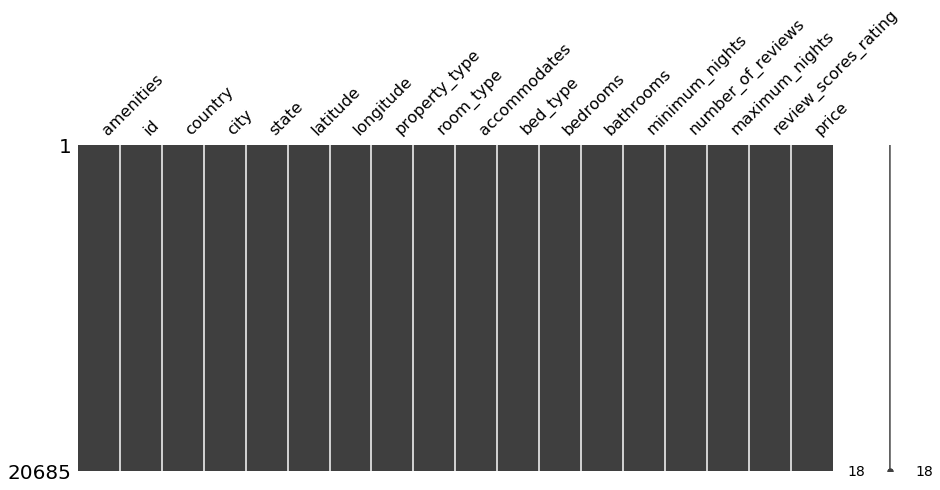

In [52]:
mno.matrix(df2, figsize = (15, 6))

EDA berbentuk heatmap untuk menampilkan korelasi dari setiap fitur yang berbentuk numerik

In [53]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(z = df2.corr().values, x = df2.corr().index, y = df2.corr().index))                
fig.show()

EDA yang menampilkan rasio minimum nights dan maximum nights dari seluruh asset airbnb yang berhasil di scrapping

In [54]:
import plotly.graph_objects as go

x0 = df2['minimum_nights']
x1 = df2['maximum_nights']

fig = go.Figure()
fig.add_trace(go.Histogram(
    x=x0,
    name='Minimum Stay Period', # name used in legend and hover labels
    xbins=dict( # bins used for histogram
        size=500
    ),
    marker_color='#EB89B5',
    opacity=1
))
fig.add_trace(go.Histogram(
    x=x1,
    name='Maximum Stay Period',
    xbins=dict(
        size=500
    ),
    marker_color='#330C73',
    opacity=1
))

fig.update_layout(
    title_text='Period of Stay Comparison', # title of plot
    xaxis_title_text= 'Allowed Period', # xaxis label
    yaxis_title_text= 'Occurence', # yaxis label
)

fig.show()

EDA yang menampilkan perbandingan bedtype pada semua asset airbnb, karena bedtype ini juga yang mempengaruhi larisnya asset tersebut untuk di booking

In [55]:
import plotly.express as px
fig = px.histogram(df2, x = 'property_type', color = 'bed_type')
fig.update_layout(
    title_text='Melbourne Airbnb Asset Type', # title of plot
    xaxis_title_text= 'Property and Bed Type ', # xaxis label
    yaxis_title_text= 'Assets', # yaxis label
)
fig.show()

EDA yang menampilkan populasi jenis asset airbnb di kota mebourne dan sekitarnya

In [56]:
import plotly.graph_objects as go

labels = list(df2['room_type'].value_counts().index)
values = list(df2['room_type'].value_counts().values)

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5)])
fig.show()

EDA yang menampilkan price tertinggi pada seluruh asset airbnb

In [57]:
property_fix = df2.groupby('property_type').max()['price'].sort_values(ascending = False).head()
property_fix

property_type
Apartment         9000
Townhouse         8000
House             4445
Villa             2400
Boutique hotel    2000
Name: price, dtype: int64

In [58]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatterpolar(
  r=[9000, 8000, 4445, 2400, 2050],
  theta=['Apartment','Town House','House', 'Villa',
           'Boutique Hotel'],
  fill='toself'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True
    ),
  ),
  showlegend=False
)

fig.show()

EDA untuk menampilkan jenis asset airbnb yang paling laris dari jumlah review guest

In [59]:
review_count_fix = df2.groupby('property_type').count()['number_of_reviews'].sort_values(ascending = False).head()
review_count_fix

property_type
Apartment             12211
House                  4711
Townhouse              1220
Condominium             538
Serviced apartment      478
Name: number_of_reviews, dtype: int64

In [60]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatterpolar(
  r=[12211, 4711, 1220, 538, 478],
  theta=['Apartment','House','Town House', 'Condominium',
           'Serviced Apartment'],
  fill='toself'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True
    ),
  ),
  showlegend=False
)

fig.show()

EDA yang memperlihatkan fitur fitur paling penting dari hasil pemikiran model

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [62]:
model_temp = RandomForestRegressor()
x = pd.get_dummies(df2.drop(['price','amenities'],axis=1),drop_first=True)
y = df2['price']
X_train,X_test,y_train,y_test = train_test_split(x, y, random_state = 101, test_size = 0.2)
model_temp.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [63]:
feature_importance = pd.Series(model_temp.feature_importances_,index=x.columns).sort_values(ascending=False).head()
data = feature_importance

In [64]:
data_feature = pd.DataFrame(data).reset_index()

In [65]:
data_feature.columns = ['Feature Importances', 'Values']

In [66]:
data_feature

,Feature Importances,Values
0,bedrooms,0.203523
1,longitude,0.107399
2,minimum_nights,0.098082
3,bathrooms,0.095222
4,property_type_Townhouse,0.092257


In [67]:
import plotly.express as px

fig = px.bar(data_feature, x ='Feature Importances', y ='Values', color='Feature Importances', height=600)
fig.show()

EDA yang menamoilkan sebaran asset aibnb terhadap pusat kota Melbourne, dalam grafik ini dapat disimpulkan bahwa minsu( guest house ala Taiwan) paling dekat dengan pusat kota, sedangkan campsite yang paling jauh dari pusat kota

In [68]:
import folium
from folium.plugins import HeatMap

In [69]:
list_lat_long = []
for index,value in df2.iterrows():
    temp = [value['latitude'], value['longitude']]
    list_lat_long.append(temp)

In [70]:
total_price_mean = df2.groupby(['property_type']).mean()[['price']].sort_values(by='price')

In [71]:
map_melbourne = folium.Map(location=[-37.8136,144.9631],zoom_start=10,tiles='OpenStreetMap',control_scale=True)
HeatMap(data=list_lat_long, radius=10, oppacity=0.1).add_to(map_melbourne)

folium.Marker([-37.8136,144.9631],
              popup='Melbourne',
              icon = folium.Icon(color = 'red', icon ='home', prefix = 'fa')
              ).add_to(map_melbourne)

for item in range (len(total_price_mean)):
    folium.Circle([-37.8136,144.9631],
                  radius=list((total_price_mean.values[item]+2)*50),
                  tooltip=str(total_price_mean.index[item]),
                 ).add_to(map_melbourne)

map_melbourne

EDA berbentuk animasi yang menampilkan sebaran jenis asset airbnb berdasarkan titik latitude dan longitude 

In [72]:
import plotly.express as px
fig = px.scatter_geo(df2,lat='latitude',lon='longitude',animation_frame='property_type',projection='natural earth')
fig.show()

# Feature Engineering & Modelling

Memulai feature engineering, memilah fitur yang masih berbentuk object

In [73]:
# Feature Engineering
object_fix = list(df2.select_dtypes(include='object'))

In [74]:
object_fix

['amenities',
 'country',
 'city',
 'state',
 'property_type',
 'room_type',
 'bed_type']

Semua fitur yang bertipe object akan dikonversi menggunakan metode binary encoding

In [75]:
from category_encoders import BinaryEncoder

In [76]:
binaryEnc = BinaryEncoder(cols = ['country', 'city', 'state', 'property_type', 'room_type', 'bed_type'], drop_invariant = True)

Penentuan model berdasarkan MAE,MSE dan RMSE, algoritma yang paling bagus akan digunakan untuk modelling

In [77]:
def regression(dataFrame, target,column_to_drop):
    
    from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
    from sklearn.tree import DecisionTreeRegressor
    from sklearn.linear_model import Lasso,Ridge,LinearRegression
    from sklearn.model_selection import train_test_split
    from sklearn import metrics
    x = binaryEnc.fit_transform(dataFrame).drop([target,column_to_drop],axis = 1)
    y = dataFrame[target]
    X_train,X_test,y_train,y_test = train_test_split(x, y, random_state = 101, test_size = 0.2)
    
    algo = [RandomForestRegressor, GradientBoostingRegressor, DecisionTreeRegressor, Lasso, Ridge, LinearRegression]
    model = []
    scores = []
    for item in algo:
        model.append(item())
    
    for item in model:
        item.fit(X_train,y_train)
        prediction = item.predict(X_test)
        mae = metrics.mean_absolute_error(prediction, y_test)
        mse = metrics.mean_squared_error(prediction, y_test)
        rmse = np.sqrt(metrics.mean_squared_error(prediction, y_test))
        temp = map(float,[mae,mse,rmse])
        scores.append(temp)
        
    uwu = pd.DataFrame(scores,columns=['MAE', 'MSE', 'RMSE'], index=['RandomForestRegressor', 'DecisionTreeRegressor',
                                                                     'GradientBoostingRegressor',
                                                                     'Lasso', 'Ridge', 'LinearRegression'])
    return uwu                     

In [78]:
from sklearn.linear_model import Lasso,Ridge,LinearRegression
from sklearn.model_selection import train_test_split

Penghapusan data dalam fitur price dengan rentang harga tertentu karena mengakibatkan MAE setiap algoritma menjadi besar

In [79]:
df2['price'].describe()

count    20685.000000
mean       146.809814
std        176.300562
min          0.000000
25%         71.000000
50%        114.000000
75%        165.000000
max       9000.000000
Name: price, dtype: float64

In [80]:
take_out_harga = df2[df2['price'] > 165].index
df2 = df2.drop(take_out_harga)

In [81]:
take_out_sinol = df2[df2['price'] == 0].index
df2 = df2.drop(take_out_sinol)

In [82]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15581 entries, 0 to 22893
Data columns (total 18 columns):
amenities               15581 non-null object
id                      15581 non-null int64
country                 15581 non-null object
city                    15581 non-null object
state                   15581 non-null object
latitude                15581 non-null float64
longitude               15581 non-null float64
property_type           15581 non-null object
room_type               15581 non-null object
accommodates            15581 non-null int64
bed_type                15581 non-null object
bedrooms                15581 non-null float64
bathrooms               15581 non-null float64
minimum_nights          15581 non-null int64
number_of_reviews       15581 non-null int64
maximum_nights          15581 non-null int64
review_scores_rating    15581 non-null int64
price                   15581 non-null int64
dtypes: float64(4), int64(7), object(7)
memory usage: 2.3+ MB


Reset index setelah melakukan penghapusan terakhir

In [83]:
df2 = df2.reset_index(drop=True)

Uji coba modelling dengan LinearRegression dengan parameter default,untuk menguji seberapa linearnya hasil prediksi

In [84]:
model = LinearRegression()
x = binaryEnc.fit_transform(df2).drop(['amenities','id','price','latitude','longitude','number_of_reviews','review_scores_rating'], axis = 1)
y = df2['price']

In [85]:
X_train,X_test,y_train,y_test = train_test_split(x, y, random_state = 101, test_size = 0.2)
model.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [86]:
prediction = model.predict(X_test)

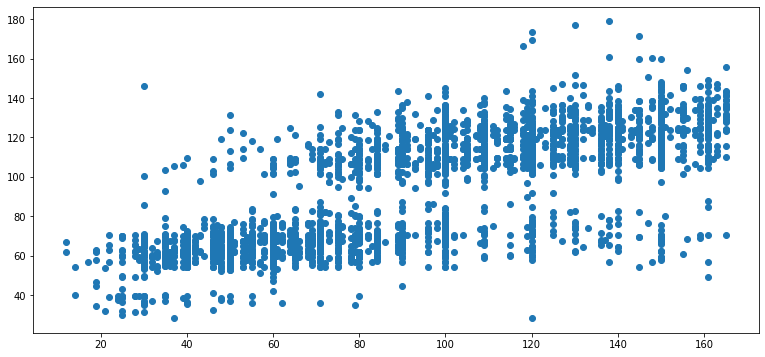

In [87]:
plt.figure(figsize=(13,6))
plt.scatter(x = y_test, y = prediction)

Pemilihan algoritma yang memiliki nilai terbaik, algoritma yang dipilih adalah RandomForestRegressor()

In [88]:
regression(df2,'price','amenities')

,MAE,MSE,RMSE
RandomForestRegressor,18.065448,567.885679,23.830352
DecisionTreeRegressor,18.285211,556.952334,23.599838
GradientBoostingRegressor,23.881938,1044.900225,32.324916
Lasso,20.655732,673.901893,25.959620
Ridge,19.882131,640.348933,25.305117
LinearRegression,19.882340,640.374212,25.305616


Melakukan GridSeachCV untuk mencari hyperparameter dari RandomForestRegressor

In [89]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestRegressor

In [90]:
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 101)

In [91]:
param1 = {'min_samples_leaf' : [10,20,30,40,50], 'min_samples_split' : [10,20,30,40,50], 
         'n_estimators' : [10,100,1000], 'bootstrap': [True, False],
         'max_depth': [10, 100, None],'max_features': ['auto', 'sqrt']}
param2 = {'min_samples_leaf' : [10,20,30,40,50], 'min_samples_split' : [10,20,30,40,50], 
         'n_estimators' : [10,100,1000]}

In [92]:
grid = GridSearchCV(RandomForestRegressor(), param2, cv = 3, verbose = 2)

In [93]:
# grid.fit(X_train,y_train)

In [94]:
# grid.best_params_

In [95]:
# grid.best_score_

# Best parameters  : 
# 1. {'min_samples_leaf': 10, 'min_samples_split': 50, 'n_estimators': 1000}

# 2.  {'bootstrap': False, 'max_depth': None, 'max_features': 'sqrt',
# 'min_samples_leaf': 10,'min_samples_split': 20,'n_estimators': 1000}

In [96]:
def regression_fix(dataFrame, target,column_to_drop):
    
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import train_test_split
    from sklearn import metrics
    x = binaryEnc.fit_transform(dataFrame).drop([target,column_to_drop],axis = 1)
    y = dataFrame[target]
    X_train,X_test,y_train,y_test = train_test_split(x, y, random_state = 101, test_size = 0.2)
    
    algo = [RandomForestRegressor]
    model = []
    scores = []
    for item in algo:
        model.append(item(min_samples_leaf = 10, min_samples_split = 50, n_estimators = 1000))
    
    for item in model:
        item.fit(X_train,y_train) 
        prediction = item.predict(X_test)
        mae = metrics.mean_absolute_error(prediction, y_test)
        mse = metrics.mean_squared_error(prediction, y_test)
        rmse = np.sqrt(metrics.mean_squared_error(prediction, y_test))
        temp = map(float,[mae,mse,rmse])
        scores.append(temp)
        
    uwu = pd.DataFrame(scores,columns=['MAE', 'MSE', 'RMSE'], index=['RandomForestRegressor'])
    return uwu                     

Melakukan pemeriksaan ulang terhadap model yang sudah mendapatkan hyperparameter

In [97]:
regression_fix(df2,'price','amenities')

,MAE,MSE,RMSE
RandomForestRegressor,17.722892,530.026431,23.022303


Membuat dataframe baru untuk keperluam recomendation modeling dan NLP

# Additional Data Preparation for 2nd and 3rd Modelling

In [98]:
df_rate1 = pd.DataFrame(df2['city'])
df_rate1['location'] = df['street']
df_rate1['asset'] = df['name']
df_rate1['summary']  = df['summary']
df_rate1['amenities'] = df2['amenities']
df_rate1['score'] = df2['review_scores_rating']
df_rate1['price'] = df2['price']

In [99]:
df_rate1 = df_rate1.fillna(method = 'ffill')

In [100]:
df_rate1 = df_rate1.fillna(method = 'bfill')

In [101]:
bad_rating = [x for x in range(20,41)]
neutral_rating = [x for x in range(41,61)]
ok_rating = [x for x in range(61,81)]
good_rating = [x for x in range(81,101)]

In [102]:
def score_category(x):
    if x in bad_rating:
        return 'Poor'
    elif x in neutral_rating:
        return 'Average'
    elif x in ok_rating:
        return 'Good'
    else:
        return 'Superb'

In [103]:
def amenities (x):
    x = x.replace('{' , '')
    x = x.replace('}','')
    x = x.replace('"','')
    x = x.split(',')
    return ' '.join(x)

In [104]:
df_rate1['amenities'] = df_rate1['amenities'].apply(amenities)

In [105]:
df_rate1['category'] = df_rate1['score'].apply(score_category)

In [106]:
df_rate1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15581 entries, 0 to 15580
Data columns (total 8 columns):
city         15581 non-null object
location     15581 non-null object
asset        15581 non-null object
summary      15581 non-null object
amenities    15581 non-null object
score        15581 non-null int64
price        15581 non-null int64
category     15581 non-null object
dtypes: int64(2), object(6)
memory usage: 973.9+ KB


Mempersiapkan fitur baru berdasarkan summary dari guest terhadap asset airbnb, termasuk melakukan split juga common words filter

In [107]:
def amenities_zero(x):
    x = x.replace('','As Usual')
    return x

In [108]:
def clean_text(x):
    letter_only = re.sub('(^a-zA-Z)',' ', x )
    return ' '.join(letter_only.split()).lower()

In [109]:
def ganti_text(x):
    string = x
    items_to_remove = ['apartment','melbourne','&','-','2']
    result = list(filter(lambda x: x not in items_to_remove, string.split(' ')))
    return ' '.join(result)

In [110]:
df_rate1['text_length'] = df_rate1['summary'].apply(lambda x :len(x))
df_rate1['clean_text'] = df_rate1['summary'].apply(clean_text)
df_rate1['clean_text_length'] = df_rate1['clean_text'].apply(lambda x :len(x))
df_rate1['clean_text'] = df_rate1['clean_text'].apply(ganti_text)

In [111]:
df_rate1['amenities'] = amenities_zero(df_rate1['amenities'])
df_rate1['clean_text'] = amenities_zero(df_rate1['clean_text'])

In [112]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer
from sklearn.metrics.pairwise import cosine_similarity

In [113]:
cv = CountVectorizer()
cv_amenities_result = cv.fit_transform(df_rate1['amenities'])

In [114]:
cv_df=pd.DataFrame(cv_amenities_result.todense(),columns=cv.get_feature_names(),index=df_rate1['asset'])

In [115]:
cv_df.head(5)

,24,access,accessible,aid,air,allowed,amazon,and,area,as,baby,babysitter,backyard,balcony,bars,basics,bath,bathroom,bathtub,bbq,beach,beachfront,bed,bedroom,before,blankets,body,books,breakfast,building,buzzer,cable,carbon,card,cat,ceiling,central,chair,changing,charger,check,checkout,children,cleaning,clearance,coffee,comforts,conditioning,connection,console,...,smart,smoke,smoking,soaking,soap,sound,spot,staff,stair,standing,stays,steam,step,stove,street,suitable,suite,sun,system,table,term,terrace,this,to,toilet,top,towel,toys,translation,travel,tub,tv,usual,valet,view,walk,warming,washer,water,waterfront,well,wheelchair,wide,wifi,window,wine,wireless,with,workspace,you
asset,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Beautiful Room & House,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
Room in Cool Deco Apartment in Brunswick,1,0,0,1,1,2,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0
St Kilda 1BR APT+BEACHSIDE+VIEWS+PARKING+WIFI+AC,1,0,0,1,1,1,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,1,0
Large private room-close to city,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0
Melbourne BnB near City & Sports,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


In [116]:
cos_sim_asset = cosine_similarity(cv_amenities_result)

In [117]:
index_to_search=df_rate1[df_rate1['asset']=='Beautiful Room & House'].index[0]
pd.Series(cos_sim_asset[index_to_search],index=df_rate1['asset']).sort_values(ascending=False)

asset
Beautiful Room & House                                                  1.000000
Moderm City Living at its Finest                                        0.714435
SQ2 - 2BR/2BATH (VIC MARKET + MELB CENTRAL)                             0.711512
Unbeatable Value Boutique Apartment                                     0.707107
Location central! Melbourne CBD                                         0.693375
Quiet family home in Hampton!                                           0.663489
Degraves Street, Melbourne                                              0.663489
Home Away From Home                                                     0.661438
Stylish room - Caulfield. Melbourne                                     0.661438
St Kilda sunshine  & convenience                                        0.661438
Views to die for - Kangaroo Room                                        0.661438
Spacious 1 bedroom in Melb CBD                                          0.649519
South Melbourne 1BR pl

In [118]:
def get_recomendation_based_amenities(asset):
    index_to_search=df_rate1[df_rate1['asset']==asset].index[0]
    series_similiar=pd.Series(cos_sim_asset[index_to_search])
    index_similiar = series_similiar.sort_values(ascending=False).head(10).index
    return df_rate1.loc[index_similiar]

Mencari TF-IDF dari seluruh corpus

In [119]:
count_vectorizer_transformer = CountVectorizer().fit(df_rate1['clean_text'])
count_vectorizer_res = count_vectorizer_transformer.transform(df_rate1['clean_text'])

In [120]:
pd.DataFrame(count_vectorizer_res.todense(), columns = count_vectorizer_transformer.get_feature_names())

,00,000,00am,00noon,00pm,01,02,03,04,05,06,07,07th,08,09,09th,0ur,0xx4l,10,100,1000,1000m2,1000mbps,1000s,1000steps,1000tc,1000含早餐,100acres,100gb,100m,100m2,100mb,100mbps,100mbs,100metres,100mt,100mts,100米,100米可达melbouren,101,102m2,103,104,10438565,105,10573212,107,107417903,108,109,...,위치,위치하고,위치하며,입니다,있습니다,있어,있으며,있으시면,작은,잘들어오는,장점은,저희,저희는,저희집은,적합합니다,전망,전화드려요,전화번호,접근성이,정류장,좋은,집은,집의,집입니다,집주변으로,창이,출장자,카페들과,커플,커플이,코너,크고,트램,트레인,편리해요,프라이빗,하고,하우스라,한국분들은,한국으로,한국인,해가,호스트에게,호스트입니다,호주인,환영합니다,ｴｱﾎﾟｰﾄへの送り迎え可能です,ｼﾝｸﾞﾙ,ﾀﾞﾌﾞﾙﾍﾞｯﾄﾞあり,ﾘﾋﾞﾝｸﾞもひろびろ
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [121]:
tf_idf_transformer = TfidfTransformer().fit(count_vectorizer_res)
tf_idf_res = tf_idf_transformer.transform(count_vectorizer_res)

Membentuk dataframe TF-IDF

In [122]:
df_tf_idf = pd.DataFrame(tf_idf_res.todense(), columns = count_vectorizer_transformer.get_feature_names())

In [123]:
listMeaning = []
for item in range(len(df_rate1)):
    mean_ing = list(df_tf_idf.iloc[item].sort_values(ascending = False).head(3).index)
    listMeaning.append(mean_ing)

In [124]:
df_rate1['meaningful_words'] = listMeaning

In [125]:
df_rate1

,city,location,asset,summary,amenities,score,price,category,text_length,clean_text,clean_text_length,meaningful_words
0,Melbourne,"Bulleen, VIC, Australia",Beautiful Room & House,A large air conditioned room with queen spring...,Internet Wifi Pets live on this property Dog(s),90,60,Superb,232,a large air conditioned room with queen spring...,232,"[spring, conditioned, international]"
1,Melbourne,"Brunswick East, VIC, Australia",Room in Cool Deco Apartment in Brunswick,A large air conditioned room with queen spring...,TV Internet Wifi Air conditioning Kitchen Heat...,87,35,Superb,232,a large air conditioned room with queen spring...,232,"[spring, conditioned, international]"
2,Melbourne,"St Kilda, VIC, Australia",St Kilda 1BR APT+BEACHSIDE+VIEWS+PARKING+WIFI+AC,RIGHT IN THE HEART OF ST KILDA! It doesn't get...,TV Internet Wifi Air conditioning Kitchen Free...,94,159,Superb,448,right in the heart of st kilda! it doesn't get...,448,"[right, doesn, kilda]"
3,Melbourne,"Thornbury, VIC, Australia",Large private room-close to city,"Comfortable, relaxed house, a home away from ...",TV Internet Wifi Kitchen Free parking on premi...,94,50,Superb,195,"comfortable, relaxed house, a home away from h...",194,"[occasional, will, house]"
4,Melbourne,"St Kilda East, VIC, Australia",Melbourne BnB near City & Sports,"Comfortable, relaxed house, a home away from ...",Internet Wifi Heating Washer Smoke detector Es...,90,69,Superb,195,"comfortable, relaxed house, a home away from h...",194,"[occasional, will, house]"
5,East Melbourne,"Berwick, VIC, Australia",Melbourne - Old Trafford Apartment,Please note: No booking will be accepted with ...,TV Wifi Pool Kitchen Gym Elevator Heating Wash...,93,100,Superb,217,please note: no booking will be accepted with ...,215,"[announced, entering, accepted]"
6,Melbourne,"Reservoir, VIC, Australia",CLOSE TO CITY & MELBOURNE AIRPORT,Easy to travel from and to the Airport; quiet ...,TV Internet Wifi Air conditioning Kitchen Free...,97,98,Superb,228,easy to travel from and to the airport; quiet ...,228,"[baking, friendly, easy]"
7,Melbourne,"East Melbourne, VIC, Australia",Home In The City,Easy to travel from and to the Airport; quiet ...,TV Internet Wifi Air conditioning Kitchen Free...,98,98,Superb,228,easy to travel from and to the airport; quiet ...,228,"[baking, friendly, easy]"
8,Melbourne,"Oakleigh East, VIC, Australia",Tranquil Javanese-Style Apartment in Oakleigh ...,Study the exquisite detail of the antique Java...,TV Internet Wifi Air conditioning Kitchen Buzz...,95,138,Superb,246,study the exquisite detail of the antique java...,246,"[javanese, meditate, rays]"
9,Melbourne,"Frankston, VIC, Australia",Queen Room in Beautiful House,Light filled private room with Queen bed taste...,TV Wifi Kitchen Free street parking Buzzer/wir...,95,42,Superb,248,light filled private room with queen bed taste...,246,"[down, passage, lamps]"


# Prediction Test

Melakukan pengujisn pertama terhadap RandomForestRegressor model

In [126]:
model_forest = RandomForestRegressor(min_samples_leaf = 10, min_samples_split = 50, n_estimators = 1000)
model_forest.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=10, min_samples_split=50,
                      min_weight_fraction_leaf=0.0, n_estimators=1000,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [127]:
prediction_forest = model_forest.predict(X_test)

In [128]:
residual = prediction_forest - y_test

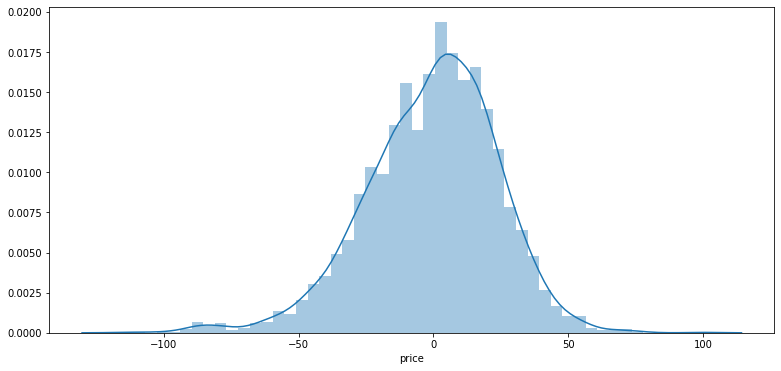

In [129]:
plt.figure(figsize=(13,6))
sns.distplot(residual)

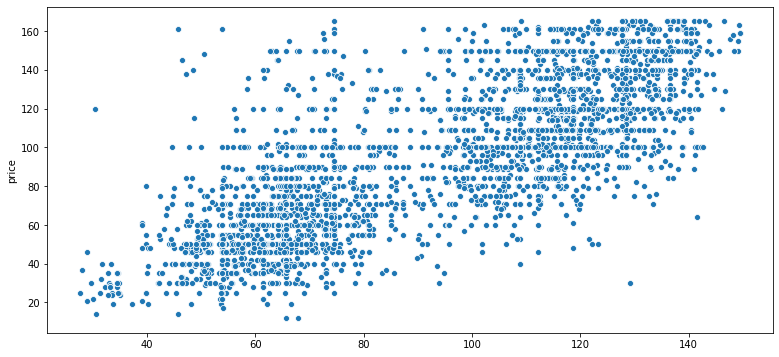

In [130]:
plt.figure(figsize=(13,6))
sns.scatterplot(prediction_forest,y_test)

In [131]:
df_predict_forest = pd.DataFrame({'True_Price' : y_test , 'Pred_Price' : prediction_forest})
df_predict_forest['Residue'] = abs(df_predict_forest['True_Price'] - df_predict_forest['Pred_Price'])

In [132]:
df_predict_forest['Pred_Price'] = round(df_predict_forest['Pred_Price'])
df_predict_forest['Residue'] = round(df_predict_forest['Residue'])

In [133]:
df_predict_forest[df_predict_forest['Pred_Price'] == 54].head(10).sort_values(by = 'Residue',ascending = False)

,True_Price,Pred_Price,Residue
6028,80,54.0,26.0
3767,75,54.0,21.0
11711,35,54.0,19.0
10566,35,54.0,19.0
7330,71,54.0,17.0
9770,69,54.0,15.0
2615,40,54.0,14.0
13832,40,54.0,14.0
1534,65,54.0,11.0
6130,48,54.0,6.0


In [134]:
df_predict_forest.reset_index(drop = True, inplace = True)

In [135]:
X_test.reset_index(drop = True, inplace = True)
y_test.reset_index(drop = True, inplace = True)

In [136]:
feat_pred = list(X_test.loc[14].values)

In [137]:
int(model_forest.predict([feat_pred]))

53

In [138]:
int(np.round(model_forest.predict([feat_pred])))

54

In [139]:
y_test.loc[14]

65

# Recommendation Test

Melakukan pengujian kedua terhadap recomendation model

In [140]:
get_recomendation_based_amenities('Beautiful Room & House')

,city,location,asset,summary,amenities,score,price,category,text_length,clean_text,clean_text_length,meaningful_words
0,Melbourne,"Bulleen, VIC, Australia",Beautiful Room & House,A large air conditioned room with queen spring...,Internet Wifi Pets live on this property Dog(s),90,60,Superb,232,a large air conditioned room with queen spring...,232,"[spring, conditioned, international]"
1799,Melbourne,"Melbourne, VIC, Australia",Moderm City Living at its Finest,"Luxury, modern, centrally located 2 bedroom ap...",Wifi Kitchen Pets live on this property Dog(s)...,73,30,Good,242,"luxury, modern, centrally located bedroom that...",242,"[best, mini, that]"
2234,Melbourne,"Carlton, VIC, Australia",SQ2 - 2BR/2BATH (VIC MARKET + MELB CENTRAL),"* Close to RMIT, Melbourne University, Victori...",TV Internet Wifi Kitchen Pets allowed Pets liv...,90,100,Superb,466,"* close to rmit, university, victoria market, ...",466,"[craziness, fight, keys]"
577,Melbourne,"Richmond, VIC, Australia",Unbeatable Value Boutique Apartment,"I am Melbourne's longest-running host, pride m...",TV Wifi Air conditioning Free parking on premi...,90,55,Superb,310,"i am melbourne's longest-running host, pride m...",310,"[longest, pride, communication]"
1956,Melbourne,"Melbourne, VIC, Australia",Location central! Melbourne CBD,Right across the road from historic Flinders S...,Internet Wifi Air conditioning Kitchen Free pa...,60,30,Average,245,right across the road from historic flinders s...,245,"[pauls, mere, fed]"
3337,Melbourne,"Hampton, VIC, Australia",Quiet family home in Hampton!,Small 2 bedroom house situated within walking ...,Internet Wifi Kitchen Free parking on premises...,90,83,Superb,233,small bedroom house situated within walking di...,233,"[downloading, streaming, everyone]"
652,Melbourne,"Melbourne, VIC, Australia","Degraves Street, Melbourne",2 bedroom modern apartment located on Degraves...,Internet Wifi Kitchen Free parking on premises...,90,46,Superb,342,"bedroom modern located on degraves street, lit...",341,"[keen, degraves, literally]"
1098,Melbourne,"Boronia, VIC, Australia",Home Away From Home,The little yellow house with the blue roof at ...,TV Wifi Air conditioning Kitchen Pets live on ...,90,120,Superb,250,the little yellow house with the blue roof at ...,248,"[the, house, yellow]"
1620,Melbourne,"Caulfield East, VIC, Australia",Stylish room - Caulfield. Melbourne,"Due to family reasons, this room was unavailab...",Internet Wifi Kitchen Smoking allowed Pets liv...,90,12,Superb,355,"due to family reasons, this room was unavailab...",354,"[mins, 15, opp]"
1673,Melbourne,"Saint Kilda, VIC, Australia",St Kilda sunshine & convenience,"My home is quite spacious, has lovely natural ...",Wifi Smoking allowed Pets live on this propert...,100,65,Superb,450,"my home is quite spacious, has lovely natural ...",442,"[it, is, secure]"


# NLP Test

Melakukan pengujian ketiga untuk mencari kata-kata yang penting dari setiap kategori summary asset airbnb

In [150]:
from collections import Counter
import nltk

In [160]:
from nltk.corpus import stopwords
sw = stopwords.words("english")

In [162]:
def Important_word(x):
    import plotly.express as px
    all_words = ' '.join(list(x))
    list_all_words = all_words.split()
    word_count = Counter(list_all_words)
    word_count_series = pd.Series(word_count)
    word_stopwords = []
    for item in word_count_series.index:
        if(item not in sw):
            word_stopwords.append(item)
    word_count_series = word_count_series.loc[word_stopwords]
    most_appeared_word = word_count_series.sort_values(ascending = False).head(20)
    word_frame = pd.DataFrame(most_appeared_word).reset_index()
    word_frame.columns = ['Important Words', 'Word Counts']
    fig = px.bar(word_frame, x ='Important Words', y ='Word Counts')
    fig.show()

In [163]:
Important_word(df_rate1[df_rate1['category'] == 'Superb']['clean_text'])

In [164]:
Important_word(df_rate1[df_rate1['category'] == 'Good']['clean_text'])

In [165]:
Important_word(df_rate1[df_rate1['category'] == 'Average']['clean_text'])

In [166]:
Important_word(df_rate1[df_rate1['category'] == 'Poor']['clean_text'])

# Export all Flask Necessities

Export Model & Dataframe untuk Flask

In [ ]:
# filename = 'RandomForest_model.sav'
# pickle.dump(model_forest, open(filename, 'wb'))

In [ ]:
# x.info()

In [ ]:
# filename = 'Random_dummies_columns.sav'
# pickle.dump(x.columns, open(filename , 'wb'))

In [ ]:
# filename = 'Random_real_columns.sav'
# pickle.dump(df2.drop(['id', 'price','longitude', 'latitude'],axis=1).columns, open(filename , 'wb'))

In [ ]:
# filename = 'df2.sav'
# pickle.dump(df2, open(filename , 'wb'))

In [ ]:
# df_rate1.info()

In [ ]:
# column_rate = ['city','location','asset', 'summary', 'score','price']

In [ ]:
# df_rate = df_rate1[column_rate]

In [ ]:
# filename = 'df2_clean.sav'
# pickle.dump(df2, open(filename , 'wb'))

In [ ]:
# filename = 'data_feature_clean.sav'
# pickle.dump(data_feature, open(filename , 'wb'))

In [ ]:
# filename = 'df_rate1_clean.sav'
# pickle.dump(df_rate, open(filename , 'wb'))

In [ ]:
# filename = 'df_rate2_clean.sav'
# pickle.dump(df_rate1, open(filename , 'wb'))

In [ ]:
# filename = 'df_predict_clean.sav'
# pickle.dump(df_predict_forest, open(filename , 'wb'))